<a href="https://colab.research.google.com/github/OlegBEZb/assesment_preparation/blob/main/Wine%20quality%20dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%%capture

!pip install scipy -U
!pip install auto-sklearn
!pip install kaggle

In [1]:
import pandas as pd
pd.set_option('display.max_colwidth', None)

In [2]:
df = pd.read_csv('WineQT.csv')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,2
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,3
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,4


In [19]:
df.drop(['Id'], axis=1, inplace=True)

In [20]:
target_col = 'quality'

# EDA

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Preprocessing

In [21]:
y = df[target_col]
X = df.drop([target_col], axis=1)

In [22]:
y.value_counts()

5    483
6    462
7    143
4     33
8     16
3      6
Name: quality, dtype: int64

In [23]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Modeling

In [33]:
minutes_limit = 4

## auto-sklearn

In [25]:
import autosklearn.classification
import sklearn
from autosklearn.metrics import balanced_accuracy, precision, recall, f1_macro, accuracy

automl = autosklearn.classification.AutoSklearnClassifier(
    time_left_for_this_task=60*minutes_limit,
    per_run_time_limit=30,
    ensemble_size=1,
    # tmp_folder='/tmp/autosklearn_resampling_example_tmp',
    disable_evaluator_output=False,
    resampling_strategy=sklearn.model_selection.StratifiedKFold(),
    resampling_strategy_arguments={'n_splits': 5},
    metric=f1_macro,
    scoring_functions=[balanced_accuracy, accuracy, precision, recall],
    include={
        'classifier': [
            'decision_tree',# 'lda', 'sgd'
        ],
        'feature_preprocessor': [
            'no_preprocessing', #'polynomial', 'select_percentile_classification'
        ]
    },
)
automl.fit(X_train, y_train)

AutoSklearnClassifier(ensemble_size=1,
                      include={'classifier': ['decision_tree'],
                               'feature_preprocessor': ['no_preprocessing']},
                      metric=f1_macro, per_run_time_limit=30,
                      resampling_strategy=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
                      resampling_strategy_arguments={'n_splits': 5},
                      scoring_functions=[balanced_accuracy, accuracy, precision,
                                         recall],
                      time_left_for_this_task=60)

In [26]:
print(automl.sprint_statistics())

auto-sklearn results:
  Dataset name: af8f0c4a-9a6c-11ec-8118-0242ac1c0002
  Metric: f1_macro
  Best validation score: 0.301217
  Number of target algorithm runs: 18
  Number of successful target algorithm runs: 17
  Number of crashed target algorithm runs: 0
  Number of target algorithms that exceeded the time limit: 1
  Number of target algorithms that exceeded the memory limit: 0



In [28]:
automl.leaderboard(detailed = True, ensemble_only=False).head()

,rank,ensemble_weight,type,cost,duration,config_id,train_loss,seed,start_time,end_time,budget,status,data_preprocessors,feature_preprocessors,balancing_strategy,config_origin
model_id,,,,,,,,,,,,,,,,
5,1,1.0,decision_tree,0.698783,1.810647,4,0.438934,0,1.646255e+09,1.646255e+09,0.0,StatusType.SUCCESS,[],[no_preprocessing],none,Random Search (sorted)
15,2,0.0,decision_tree,0.709067,2.627015,14,0.464823,0,1.646255e+09,1.646255e+09,0.0,StatusType.SUCCESS,[],[no_preprocessing],weighting,Random Search
12,3,0.0,decision_tree,0.725320,1.794608,11,0.659602,0,1.646255e+09,1.646255e+09,0.0,StatusType.SUCCESS,[],[no_preprocessing],none,Random Search (sorted)
10,4,0.0,decision_tree,0.739443,2.019640,9,0.602372,0,1.646255e+09,1.646255e+09,0.0,StatusType.SUCCESS,[],[no_preprocessing],none,Random Search (sorted)
18,5,0.0,decision_tree,0.740044,2.015288,17,0.602372,0,1.646255e+09,1.646255e+09,0.0,StatusType.SUCCESS,[],[no_preprocessing],none,Random Search (sorted)


In [29]:
df_cv_results = pd.DataFrame(automl.cv_results_).sort_values(by = 'mean_test_score', ascending = False)
df_cv_results[[c for c in df_cv_results.columns if not c.startswith('param_')]].head()

,mean_test_score,metric_balanced_accuracy,metric_accuracy,metric_precision,metric_recall,mean_fit_time,params,rank_test_scores,status,budgets
3,0.301217,0.300603,0.563457,NaN,NaN,1.810647,"{'balancing:strategy': 'none', 'classifier:__choice__': 'decision_tree', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'no_preprocessing', 'classifier:decision_tree:criterion': 'entropy', 'classifier:decision_tree:max_depth_factor': 1.5836944563156254, 'classifier:decision_tree:max_features': 1.0, 'classifier:decision_tree:max_leaf_nodes': 'None', 'classifier:decision_tree:min_impurity_decrease': 0.0, 'classifier:decision_tree:min_samples_leaf': 2, 'classifier:decision_tree:min_samples_split': 12, 'classifier:decision_tree:min_weight_fraction_leaf': 0.0, 'data_preprocessor:feature_type:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:__choice__': 'no_coalescense', 'data_preprocessor:feature_type:numerical_transformer:imputation:strategy': 'median', 'data_preprocessor:feature_type:numerical_transformer:rescaling:__choice__': 'minmax'}",1,Success,0.0
13,0.290933,0.349848,0.473742,NaN,NaN,2.627015,"{'balancing:strategy': 'weighting', 'classifier:__choice__': 'decision_tree', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'no_preprocessing', 'classifier:decision_tree:criterion': 'gini', 'classifier:decision_tree:max_depth_factor': 1.75600541653305, 'classifier:decision_tree:max_features': 1.0, 'classifier:decision_tree:max_leaf_nodes': 'None', 'classifier:decision_tree:min_impurity_decrease': 0.0, 'classifier:decision_tree:min_samples_leaf': 7, 'classifier:decision_tree:min_samples_split': 18, 'classifier:decision_tree:min_weight_fraction_leaf': 0.0, 'data_preprocessor:feature_type:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:__choice__': 'no_coalescense', 'data_preprocessor:feature_type:numerical_transformer:imputation:strategy': 'most_frequent', 'data_preprocessor:feature_type:numerical_transformer:rescaling:__choice__': 'standardize'}",2,Success,0.0
10,0.274680,0.276270,0.584245,NaN,NaN,1.794608,"{'balancing:strategy': 'none', 'classifier:__choice__': 'decision_tree', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'no_preprocessing', 'classifier:decision_tree:criterion': 'gini', 'classifier:decision_tree:max_depth_factor': 1.1421148328677273, 'classifier:decision_tree:max_features': 1.0, 'classifier:decision_tree:max_leaf_nodes': 'None', 'classifier:decision_tree:min_impurity_decrease': 0.0, 'classifier:decision_tree:min_samples_leaf': 17, 'classifier:decision_tree:min_samples_split': 9, 'classifier:decision_tree:min_weight_fraction_leaf': 0.0, 'data_preprocessor:feature_type:categorical_transformer:categorical_encoding:__choice__': 'no_encoding', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:__choice__': 'minority_coalescer', 'data_preprocessor:feature_type:numerical_transformer:imputation:strategy': 'most_frequent', 'data_preprocessor:feature_type:numerical_transformer:rescaling:__choice__': 'minmax', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:minority_coalescer:minimum_fraction': 0.023654226219422092}",3,Success,0.0
8,0.260557,0.266876,0.545952,NaN,NaN,2.019640,"{'balancing:strategy': 'none', 'classifier:__choice__': 'decision_tree', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'no_preprocessing', 'classifier:decision_tree:criterion': 'entropy', 'classifier:decision_tree:max_depth_factor': 1.899904518468103, 'classifier:decision_tree:max_features': 1.0, 'classifier:decision_tree:max_leaf_nodes': 'None', 'classifier:decision_tree:min_impurity_decrease': 0.0, 'classifier:decision_tree:min_samples_leaf': 13, 'classifier:de

In [13]:
import sklearn

# One can use models trained during cross-validation directly to predict
# for unseen data. For this, all k models trained during k-fold
# cross-validation are considered as a single soft-voting ensemble inside
# the ensemble constructed with ensemble selection.
print('Before re-fit')
predictions = automl.predict(X_test)
print("Accuracy score CV", sklearn.metrics.accuracy_score(y_test, predictions))

Before re-fit


NotImplementedError: ignored

In [30]:
# During fit(), models are fit on individual cross-validation folds. To use all 
# available data, we call refit() which trains all models in the final 
# ensemble on the whole dataset.
print('After re-fit')
automl.refit(X_train.copy(), y_train.copy())
predictions = automl.predict(X_test)
print("Accuracy score refit", sklearn.metrics.accuracy_score(y_test, predictions))

After re-fit
Accuracy score refit 0.5414847161572053


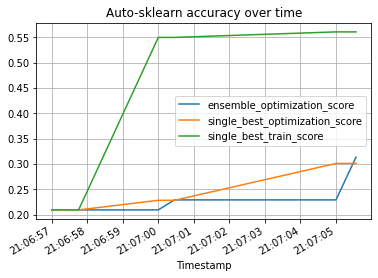

In [31]:
import matplotlib.pyplot as plt

automl.performance_over_time_.plot(
        x='Timestamp',
        kind='line',
        legend=True,
        title='Auto-sklearn accuracy over time',
        grid=True,
    )
plt.show()

In [32]:
import pprint

pp = pprint.PrettyPrinter(4)

In [33]:
pp.pprint(automl.show_models())

{   5: {   'balancing': Balancing(random_state=1),
           'classifier': <autosklearn.pipeline.components.classification.ClassifierChoice object at 0x7fafbc826c10>,
           'cost': 0.698783236377004,
           'data_preprocessor': <autosklearn.pipeline.components.data_preprocessing.DataPreprocessorChoice object at 0x7fafbc836c50>,
           'ensemble_weight': 1.0,
           'feature_preprocessor': <autosklearn.pipeline.components.feature_preprocessing.FeaturePreprocessorChoice object at 0x7fafbc826e50>,
           'model_id': 5,
           'rank': 1,
           'sklearn_classifier': DecisionTreeClassifier(criterion='entropy', max_depth=12, min_samples_leaf=2,
                       min_samples_split=12, random_state=1)}}


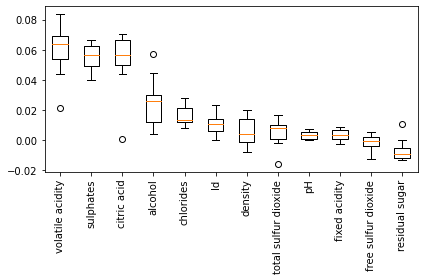

residual sugar: -0.007 +/- 0.007
free sulfur dioxide: -0.001 +/- 0.005
fixed acidity: 0.004 +/- 0.004
pH        : 0.004 +/- 0.003
total sulfur dioxide: 0.006 +/- 0.009
density   : 0.006 +/- 0.009
Id        : 0.011 +/- 0.007
chlorides : 0.016 +/- 0.006
alcohol   : 0.025 +/- 0.016
citric acid: 0.052 +/- 0.019
sulphates : 0.055 +/- 0.009
volatile acidity: 0.060 +/- 0.016


In [34]:
from sklearn.inspection import plot_partial_dependence, permutation_importance

r = permutation_importance(automl, X_test, y_test, n_repeats=10, random_state=0)
sort_idx = r.importances_mean.argsort()[::-1]

plt.boxplot(r.importances[sort_idx].T,
            labels=[X_test.columns[i] for i in sort_idx])

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

for i in sort_idx[::-1]:
    print(f"{X_test.columns[i]:10s}: {r.importances_mean[i]:.3f} +/- "
          f"{r.importances_std[i]:.3f}")

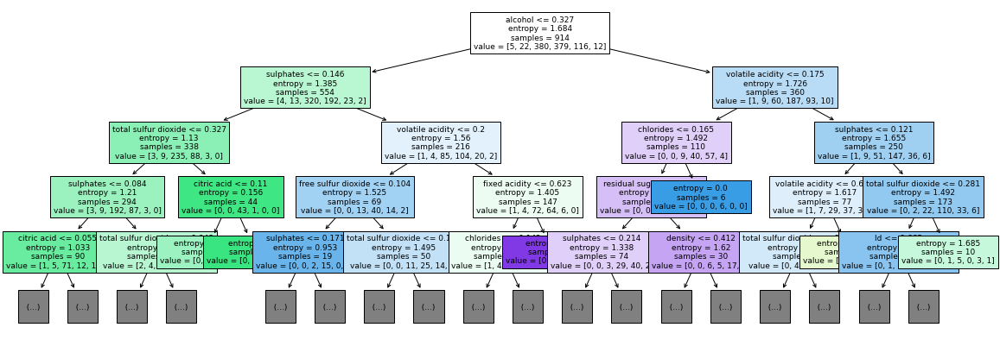

In [52]:
from sklearn.tree import DecisionTreeClassifier
from matplotlib import pyplot as plt

fig, axes = plt.subplots(nrows=1,
                        ncols=1,
                        figsize=(20, 7))

from sklearn import tree
tree.plot_tree(list(automl.show_models().values())[0]['sklearn_classifier'], 
               feature_names=X_test.columns, 
            #    class_names=automl.classes_
            filled=True,
            max_depth=4,
            fontsize=9,
               );

## H2O

In [7]:
! pip install h2o -q

     |████████████████████████████████| 176.2 MB 61 kB/s 


In [34]:
import h2o
from h2o.automl import H2OAutoML

h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O_cluster_uptime:,26 mins 33 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.36.0.3
H2O_cluster_version_age:,14 days and 18 hours
H2O_cluster_name:,H2O_from_python_unknownUser_7q8wad
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.161 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [35]:
aml = H2OAutoML(max_models =25,
                balance_classes=True,
                max_runtime_secs=minutes_limit*60,
                seed=42)

In [36]:
aml.train(training_frame=h2o.H2OFrame(pd.concat([X_train, y_train], axis=1)), 
          x = X_train.columns.tolist(),
          y=target_col)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |██████████████
11:52:01.743: DeepLearning_1_AutoML_2_20220303_115135 [DeepLearning def_1] failed: water.exceptions.H2OModelBuilderIllegalArgumentException: Illegal argument(s) for DeepLearning model: DeepLearning_1_AutoML_2_20220303_115135_cv_1.  Details: ERRR on field: _balance_classes: balance_classes requires classification.


█████████████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_6_AutoML_2_20220303_115135

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 0.039655755355860016
RMSE: 0.19913752874799873
MAE: 0.1503311804667193
RMSLE: 0.031087266779721408
R^2: 0.9398057631764458
Mean Residual Deviance: 0.039655755355860016
Null degrees of freedom: 913
Residual degrees of freedom: 900
Null deviance: 602.140

In [38]:
# View the AutoML Leaderboard
lb = aml.leaderboard
lb.head(rows=10)  # Print all rows instead of default (10 rows)

model_id,mean_residual_deviance,rmse,mse,mae,rmsle
StackedEnsemble_AllModels_6_AutoML_2_20220303_115135,0.350041,0.591643,0.350041,0.440531,0.090422
StackedEnsemble_Best1000_1_AutoML_2_20220303_115135,0.355368,0.596128,0.355368,0.437697,0.0910115
StackedEnsemble_AllModels_3_AutoML_2_20220303_115135,0.356365,0.596963,0.356365,0.437568,0.091164
StackedEnsemble_BestOfFamily_7_AutoML_2_20220303_115135,0.357389,0.59782,0.357389,0.448014,0.0912649
StackedEnsemble_BestOfFamily_3_AutoML_2_20220303_115135,0.35892,0.5991,0.35892,0.441249,0.0914435
StackedEnsemble_AllModels_2_AutoML_2_20220303_115135,0.360002,0.600002,0.360002,0.442889,0.091544
StackedEnsemble_BestOfFamily_4_AutoML_2_20220303_115135,0.360871,0.600725,0.360871,0.442515,0.0916451
StackedEnsemble_BestOfFamily_2_AutoML_2_20220303_115135,0.362794,0.602324,0.362794,0.44115,0.0920169
XRT_1_AutoML_2_20220303_115135,0.362832,0.602356,0.362832,0.447768,0.0920296
StackedEnsemble_AllModels_1_AutoML_2_20220303_115135,0.36295,0.602453,0.36295,0.441429,0.0920021


In [39]:
best_model = aml.get_best_model()
print(best_model)

Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_6_AutoML_2_20220303_115135

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 0.039655755355860016
RMSE: 0.19913752874799873
MAE: 0.1503311804667193
RMSLE: 0.031087266779721408
R^2: 0.9398057631764458
Mean Residual Deviance: 0.039655755355860016
Null degrees of freedom: 913
Residual degrees of freedom: 900
Null deviance: 602.1400437636804
Residual deviance: 36.24536039525606
AIC: -326.1328986230733

ModelMetricsRegressionGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 0.3500410706960265
RMSE: 0.5916426883652214
MAE: 0.44053082802447907
RMSLE: 0.0904220046918497
R^2: 0.468665899353914
Mean Residual Deviance: 0.3500410706960265
Null degrees of freedom: 913
Residual degrees of freedom: 899
Null deviance: 602.3013647730965
Residual deviance: 319.93753861616824
AIC: 1666.3894638030904



Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_residual_deviance,rmse,mse,mae,rmsle,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_6_AutoML_2_20220303_115135,0.350041,0.591643,0.350041,0.440531,0.090422,905,0.216496,StackedEnsemble
StackedEnsemble_Best1000_1_AutoML_2_20220303_115135,0.355368,0.596128,0.355368,0.437697,0.0910115,288,0.184973,StackedEnsemble
StackedEnsemble_AllModels_3_AutoML_2_20220303_115135,0.356365,0.596963,0.356365,0.437568,0.091164,190,0.107358,StackedEnsemble
StackedEnsemble_BestOfFamily_7_AutoML_2_20220303_115135,0.357389,0.59782,0.357389,0.448014,0.0912649,649,0.125857,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_2_20220303_115135,0.35892,0.5991,0.35892,0.441249,0.0914435,136,0.077762,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_2_20220303_115135,0.360002,0.600002,0.360002,0.442889,0.091544,154,0.11677,StackedEnsemble
StackedEnsemble_BestOfFamily_4_AutoML_2_20220303_115135,0.360871,0.600725,0.360871,0.442515,0.0916451,158,0.096138,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_2_20220303_115135,0.362794,0.602324,0.362794,0.44115,0.0920169,161,0.052955,StackedEnsemble
XRT_1_AutoML_2_20220303_115135,0.362832,0.602356,0.362832,0.447768,0.0920296,338,0.034179,DRF
StackedEnsemble_AllModels_1_AutoML_2_20220303_115135,0.36295,0.602453,0.36295,0.441429,0.0920021,157,0.073982,StackedEnsemble


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

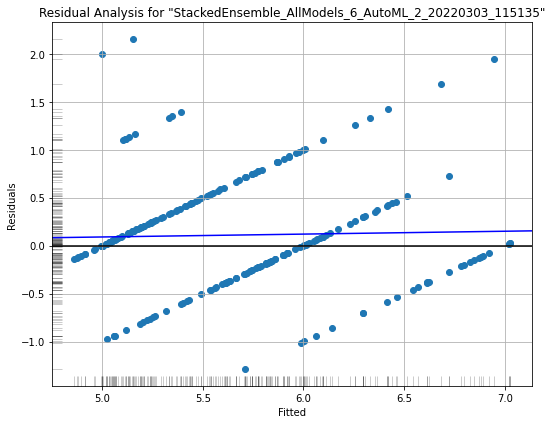

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

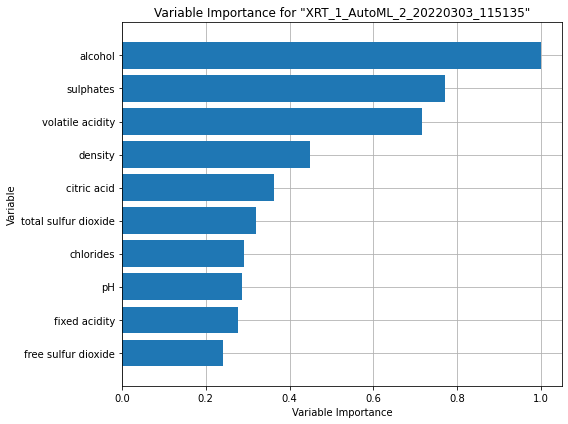

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

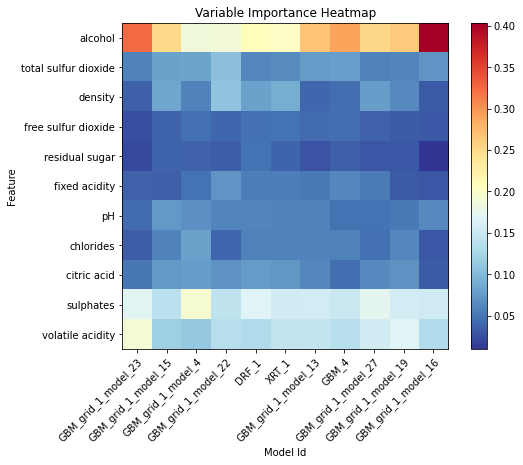

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

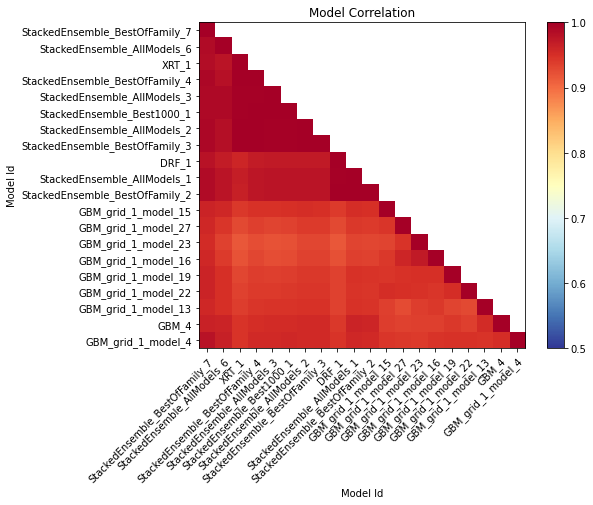

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

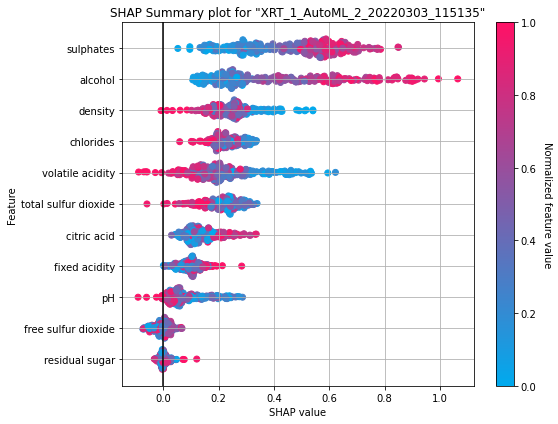

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

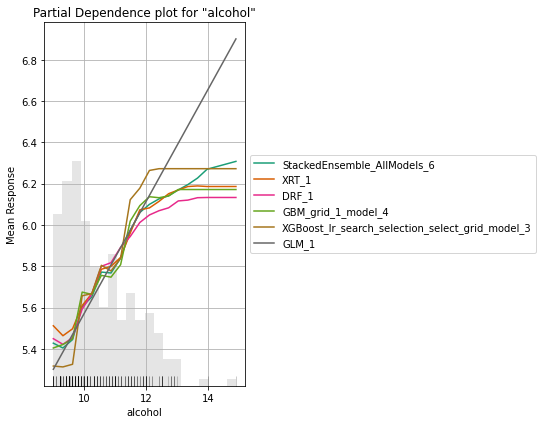

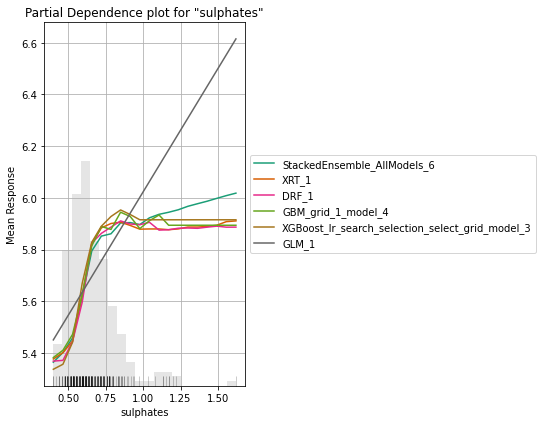

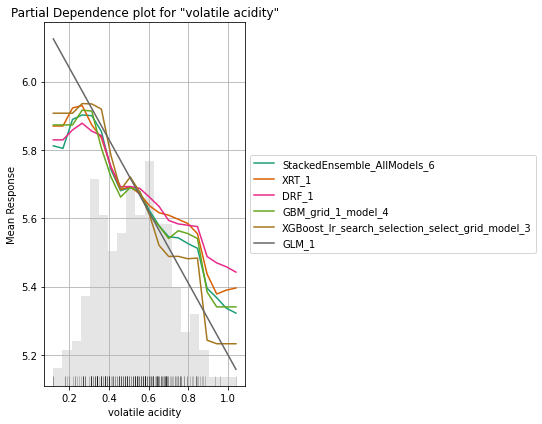

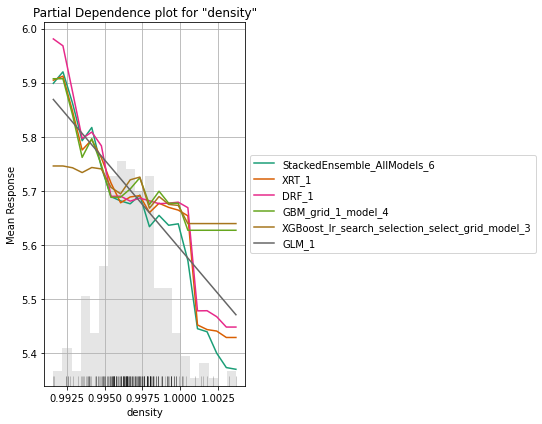

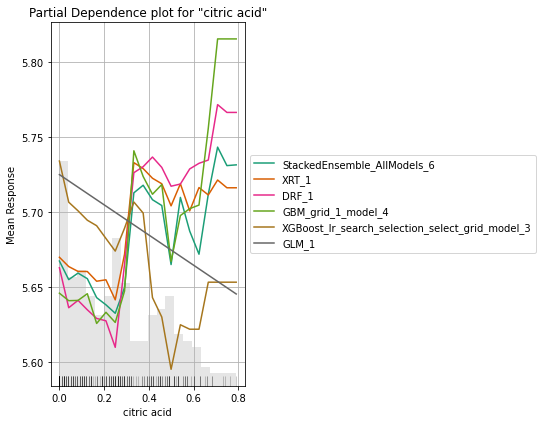

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

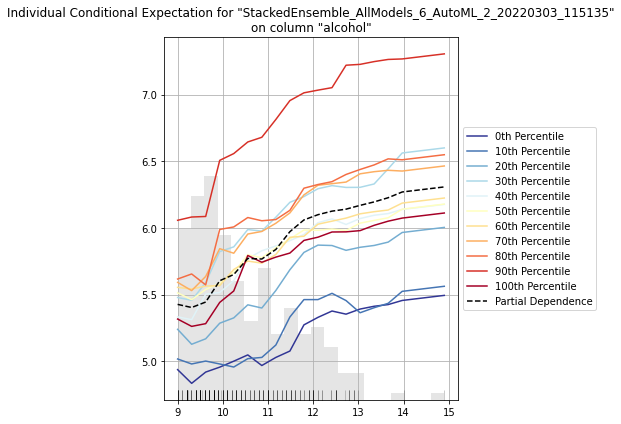

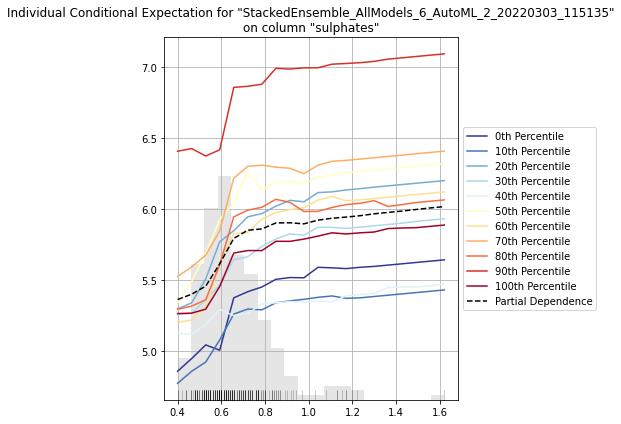

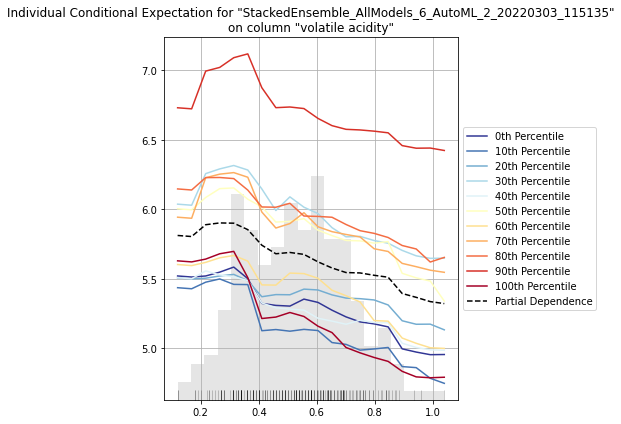

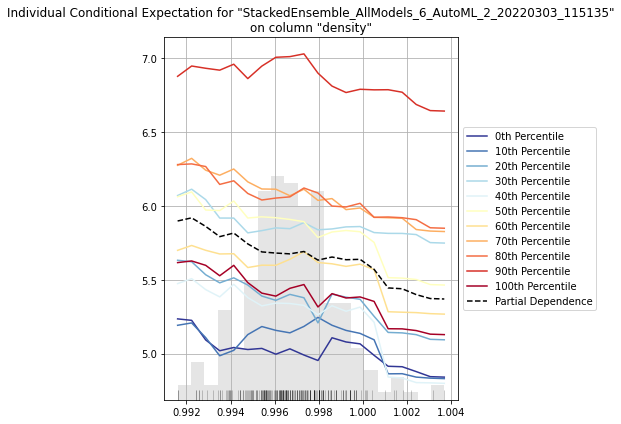

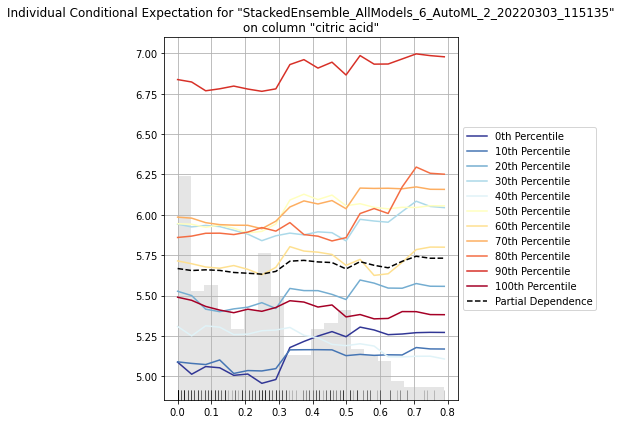

In [41]:
explain_model = aml.explain(frame = h2o.H2OFrame(pd.concat([X_test, y_test], axis=1)), 
                            figsize = (8,6))

## tpot